In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import os
import warnings
warnings.filterwarnings("ignore") 
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
#Load the Dataset and Replace with your file name : 

df=pd.read_csv (r"C:\Users\SMSM-TECH.PC\Documents\Jobs_salaries.csv")

In [3]:
#Displays the first 5 rows of the dataset :
df.head()


,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2025,SE,FT,Manager,230000,USD,230000,US,100,US,M
1,2025,SE,FT,Manager,128000,USD,128000,US,100,US,M
2,2025,SE,FT,Applied Scientist,260000,USD,260000,US,0,US,L
3,2025,SE,FT,Applied Scientist,150400,USD,150400,US,0,US,L
4,2025,MI,FT,AI Engineer,100000,EUR,105263,ES,0,ES,M


In [4]:
#Summary information about the DataFrame, such as column names, non-null counts, and data types :
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 139217 entries, 0 to 139216
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   work_year           139217 non-null  int64 
 1   experience_level    139217 non-null  object
 2   employment_type     139217 non-null  object
 3   job_title           139217 non-null  object
 4   salary              139217 non-null  int64 
 5   salary_currency     139217 non-null  object
 6   salary_in_usd       139217 non-null  int64 
 7   employee_residence  139217 non-null  object
 8   remote_ratio        139217 non-null  int64 
 9   company_location    139217 non-null  object
 10  company_size        139217 non-null  object
dtypes: int64(4), object(7)
memory usage: 11.7+ MB


In [5]:
# Shows statistical summary (like mean, min, max, std) for numeric columns :
df.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,139217.000000,1.392170e+05,139217.000000,139217.000000
mean,2024.385714,1.629350e+05,157460.724409,20.896514
std,0.678638,2.133925e+05,74162.093382,40.585695
min,2020.000000,1.400000e+04,15000.000000,0.000000
25%,2024.000000,1.060000e+05,105800.000000,0.000000
50%,2024.000000,1.470000e+05,146000.000000,0.000000
75%,2025.000000,1.988000e+05,197800.000000,0.000000
max,2025.000000,3.040000e+07,800000.000000,100.000000


In [6]:
# Checks for missing (null) values in each column and shows how many are missing :
df.isnull().sum()


work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
dtype: int64

In [8]:
#Returns the number of rows and columns in the DataFrame as a tuple : 
df.shape

(139217, 11)

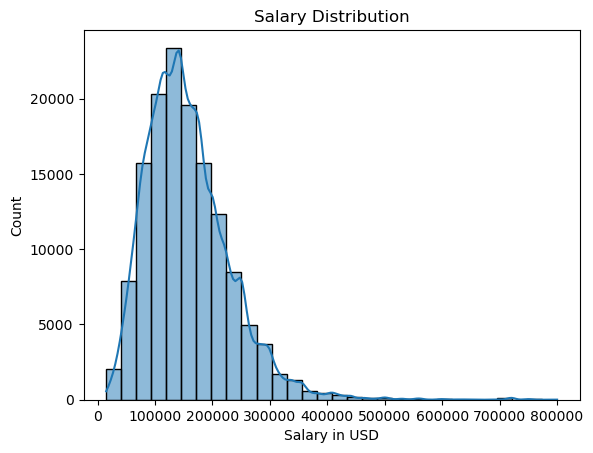

In [9]:
#Salary distribution :

sns.histplot(df['salary_in_usd'], bins=30, kde=True)
plt.title("Salary Distribution")
plt.xlabel("Salary in USD")
plt.show()


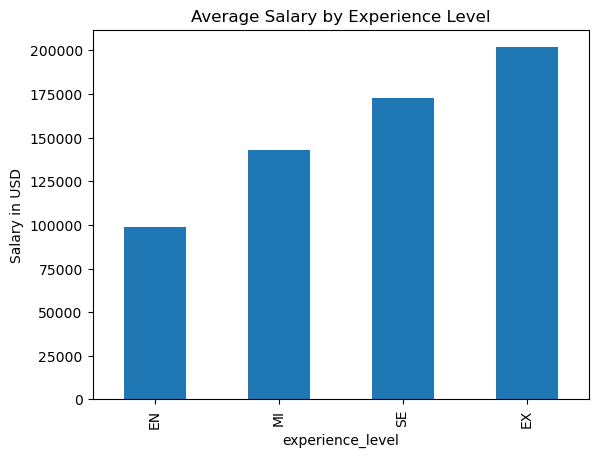

In [10]:
#Average salary by experience level : 

exp_salary = df.groupby("experience_level")["salary_in_usd"].mean().sort_values()
exp_salary.plot(kind='bar', title="Average Salary by Experience Level")
plt.ylabel("Salary in USD")
plt.show()


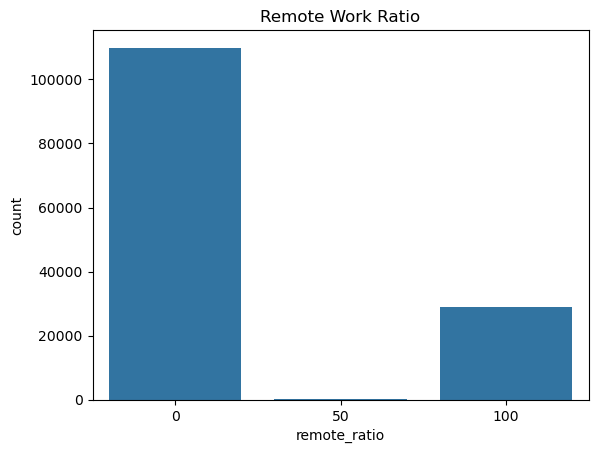

In [11]:
#Remote work analysis :

sns.countplot(data=df, x="remote_ratio")
plt.title("Remote Work Ratio")
plt.show()


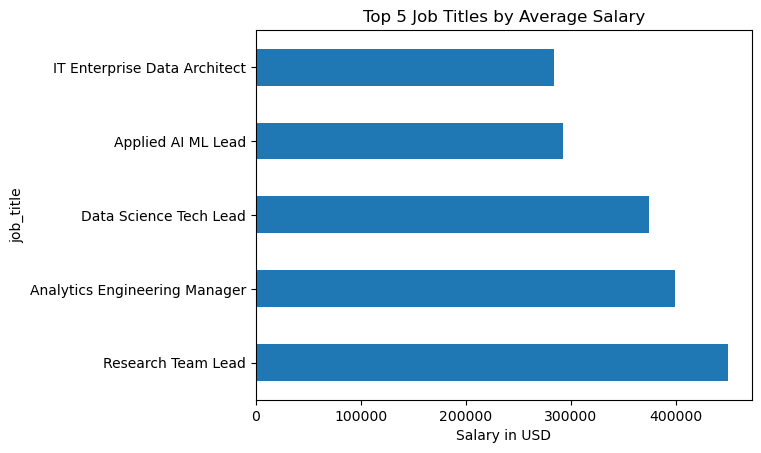

In [12]:
#Top 5 job titles by average salary :

top_jobs = df.groupby("job_title")["salary_in_usd"].mean().sort_values(ascending=False).head(5)
top_jobs.plot(kind='barh', title="Top 5 Job Titles by Average Salary")
plt.xlabel("Salary in USD")
plt.show()


In [13]:
#Returns all the unique job titles present in the job_title column of the DataFrame :
df.job_title.unique()


array(['Manager', 'Applied Scientist', 'AI Engineer', 'Data Analyst',
       'Data Analytics Specialist', 'Analyst',
       'Machine Learning Specialist', 'Product Owner',
       'Business Intelligence', 'Principal Engineer', 'Software Engineer',
       'Associate', 'Engineer', 'Product Manager',
       'Site Reliability Engineer', 'Consultant',
       'Data Management Technician', 'Power BI Developer',
       'Data Engineer', 'Power BI Expert', 'Data Architect',
       'Research Engineer', 'Developer', 'Machine Learning Engineer',
       'Machine Learning Scientist', 'Data Scientist',
       'Research Scientist', 'Director', 'Data Management',
       'Business Intelligence Developer', 'Analytics Engineer',
       'Data Developer', 'Business Analyst', 'Software Developer',
       'Data Specialist', 'Postdoctoral Researcher', 'Product Analyst',
       'Research Specialist', 'Postdoctoral Fellow', 'Staff Engineer',
       'Forward Deployed Engineer', 'Principal Researcher',
       'Full 

In [14]:
#Returns all the unique values present in the work_year column :
df.work_year.unique()


array([2025, 2024, 2023, 2022, 2020, 2021], dtype=int64)

In [15]:
# Drop the 'salary' and 'salary_currency' columns all salaries are now in USD

df = df.drop(columns = ['salary','salary_currency'],axis=1)
df.head(5)

,work_year,experience_level,employment_type,job_title,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2025,SE,FT,Manager,230000,US,100,US,M
1,2025,SE,FT,Manager,128000,US,100,US,M
2,2025,SE,FT,Applied Scientist,260000,US,0,US,L
3,2025,SE,FT,Applied Scientist,150400,US,0,US,L
4,2025,MI,FT,AI Engineer,105263,ES,0,ES,M


In [16]:
df['job_title'].value_counts() 

job_title
Data Scientist         17782
Software Engineer      15603
Data Engineer          15359
Data Analyst           12833
Engineer                9950
                       ...  
Controls Engineer          1
Quant Trader               1
AI Engineering Lead        1
Lead AI Engineer           1
LLM Engineer               1
Name: count, Length: 405, dtype: int64

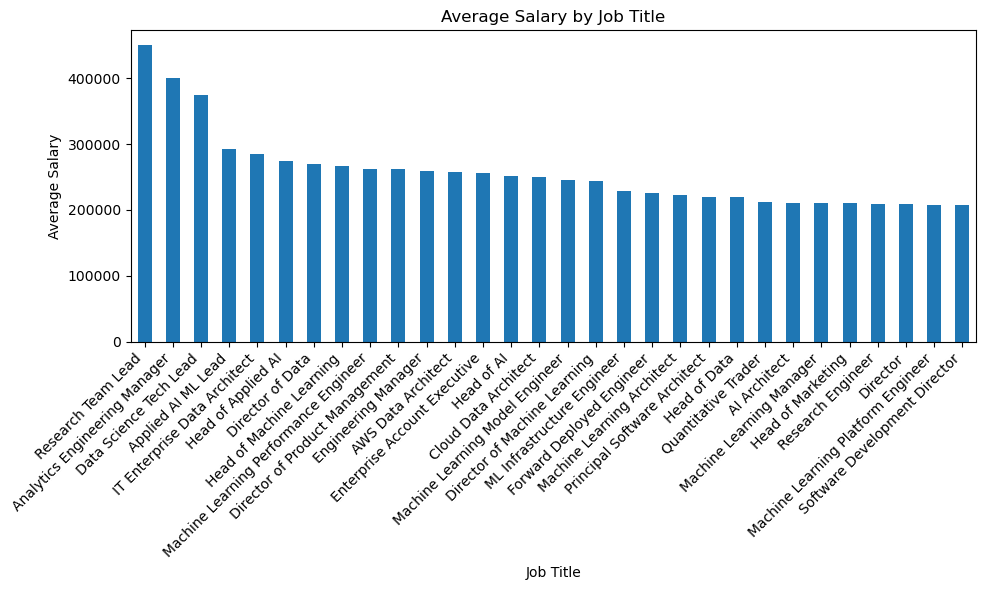

In [17]:
average_salary_by_job = df.groupby('job_title')['salary_in_usd'].mean().nlargest(30)
plt.figure(figsize=(10, 6)) 

average_salary_by_job.plot(kind='bar')
plt.title('Average Salary by Job Title')
plt.xlabel('Job Title')
plt.ylabel('Average Salary')
plt.xticks(rotation=45, ha='right') 
plt.tight_layout()
plt.show()

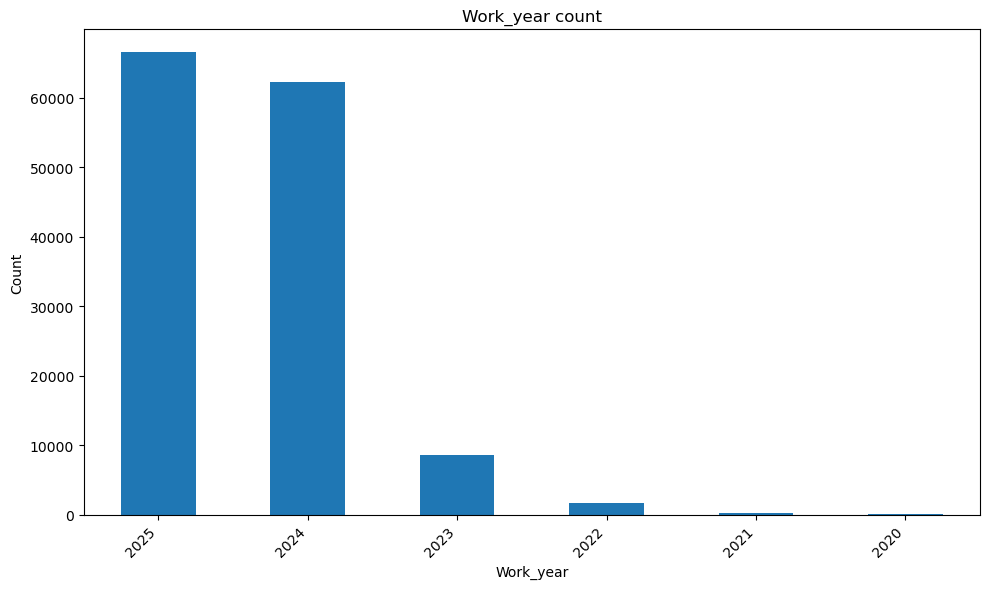

In [18]:
value_counts = df.work_year.value_counts().nlargest(10)

plt.figure(figsize=(10, 6))
value_counts.plot(kind='bar')
plt.title('Work_year count')
plt.xlabel('Work_year')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  
plt.tight_layout()
plt.show()

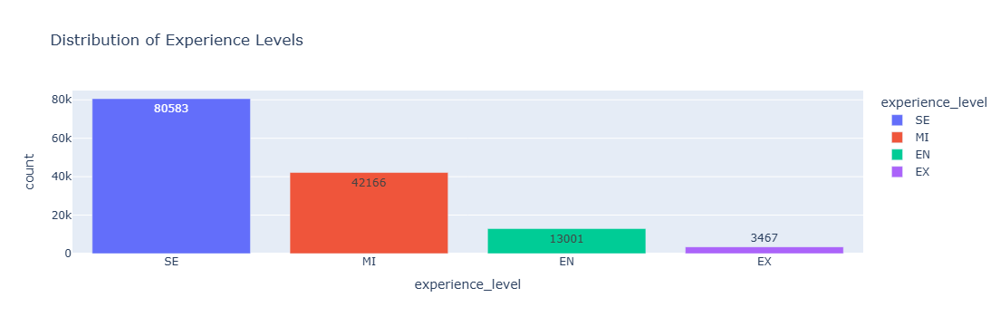

In [19]:
experience_counts = df['experience_level'].value_counts().reset_index()
experience_counts.columns = ['experience_level', 'count']

fig = px.bar(experience_counts, x='experience_level', y='count', 
             title='Distribution of Experience Levels',
             text='count', color='experience_level')

# Show the plot
fig.show()

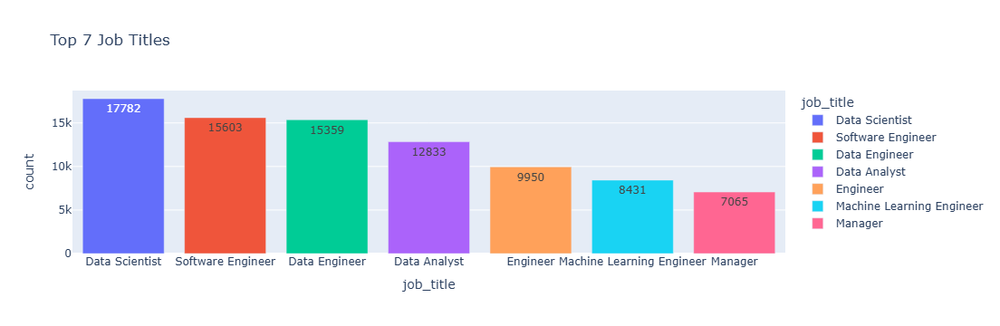

In [21]:
job_title_counts = df['job_title'].value_counts().reset_index()
job_title_counts.columns = ['job_title', 'count']

# Select the top 7 job titles

top_7_job_titles = job_title_counts.head(7)

fig = px.bar(top_7_job_titles, x='job_title', y='count', 
             title='Top 7 Job Titles',
             text='count', color='job_title')



# Show the plot
fig.show()

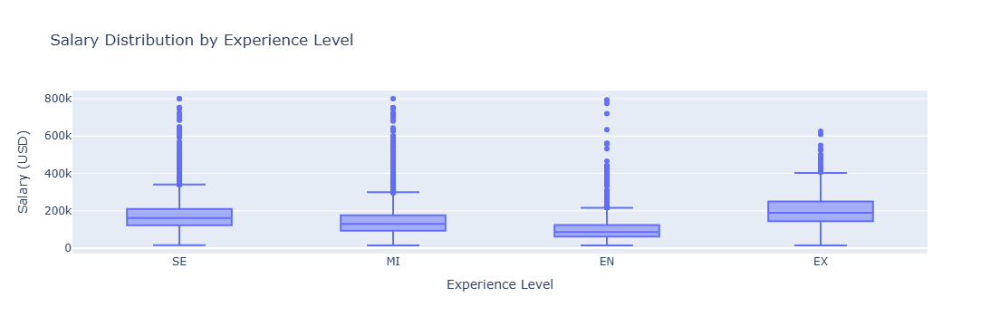

In [22]:
# Create the box plot with Plotly Express: 
box_plot = px.box(
    df,
    x='experience_level',
    y='salary_in_usd',
    title='Salary Distribution by Experience Level',
    labels={'experience_level': 'Experience Level', 'salary_in_usd': 'Salary (USD)'}
)

# Show the plot
box_plot.show()

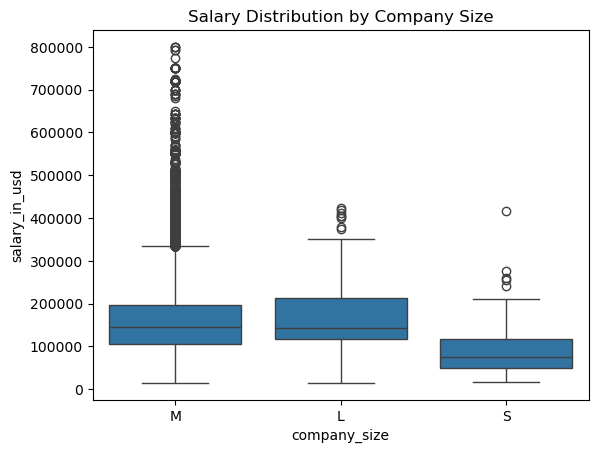

In [23]:
sns.boxplot(data=df, x="company_size", y="salary_in_usd")
plt.title("Salary Distribution by Company Size")
plt.show()

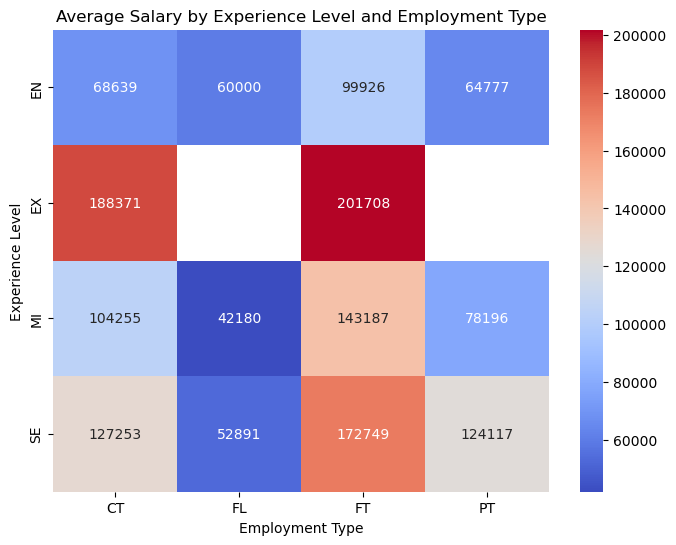

In [24]:
# Create a pivot table :
pivot_table = df.pivot_table(values='salary_in_usd', 
                             index='experience_level', 
                             columns='employment_type', 
                             aggfunc='mean')

# Heatmap:
plt.figure(figsize=(8, 6))
sns.heatmap(pivot_table, annot=True, cmap="coolwarm", fmt=".0f")
plt.title('Average Salary by Experience Level and Employment Type')
plt.xlabel("Employment Type")
plt.ylabel("Experience Level")
plt.show()

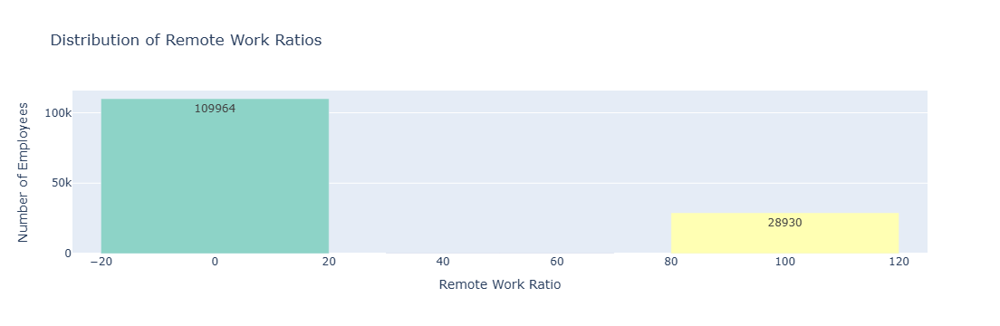

In [25]:
#1.What is the distribution of remote work ratios among employees?

data = df['remote_ratio'].value_counts().reset_index()
data.columns = ['remote_ratio', 'count']


fig = go.Figure()

fig.add_trace(go.Bar(
    x=data['remote_ratio'],
    y=data['count'],
    text=data['count'],
    textposition='inside',
    marker=dict(color=px.colors.qualitative.Set3)
))

# Customize layout
fig.update_layout(
    title='Distribution of Remote Work Ratios',
    xaxis=dict(title='Remote Work Ratio'),
    yaxis=dict(title='Number of Employees'),
)

# Show the plot
fig.show()

In [26]:
# 2.What is the average salary in USD for the employees in the dataset ? 
average_salary = df['salary_in_usd'].mean() 

print(f"The average salary in USD is: {average_salary:.2f}")

The average salary in USD is: 157460.72


In [27]:
# 3.What is the predominant employment type in the dataset?
predominant_employment_type = df['employment_type'].mode().values[0]

print(f"The predominant employment type is: {predominant_employment_type}")

The predominant employment type is: FT


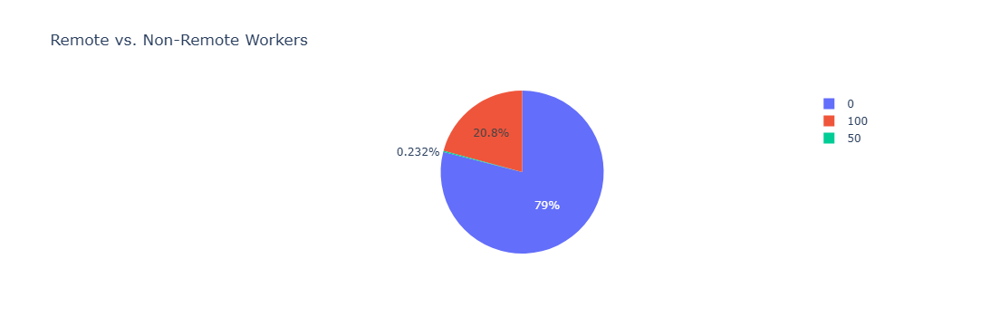

In [28]:
# 4.What is the ratio of remote to non-remote workers?

# Assuming df is your DataFrame with the remote_ratio column
fig = px.pie(df, names='remote_ratio', title='Remote vs. Non-Remote Workers') 

# Display the plot
fig.show()

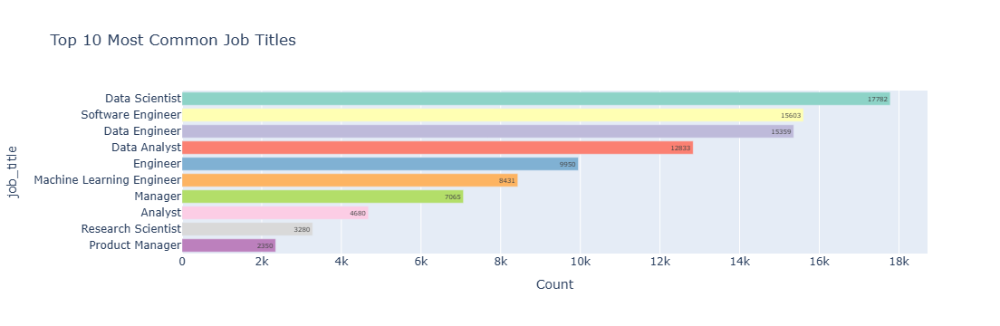

In [29]:
# 5.Which job titles are most common in the dataset? 

job_title_counts = df['job_title'].value_counts().head(10)

fig = px.bar(
    job_title_counts,
    orientation='h',
    title='Top 10 Most Common Job Titles',
    labels={'index': 'Job Title', 'value': 'Count'},
    text=job_title_counts.values,  # Display count labels inside bars
    color=job_title_counts.index,   # Assign different colors to each bar
    color_discrete_sequence=px.colors.qualitative.Set3  # Adjust color palette as needed
)

fig.update_layout(showlegend=False)  # Optional: Hide legend for a cleaner look
fig.show()

   remote_ratio  salary_in_usd
0             0  159382.230930
1            50   81491.634675
2           100  151005.192879


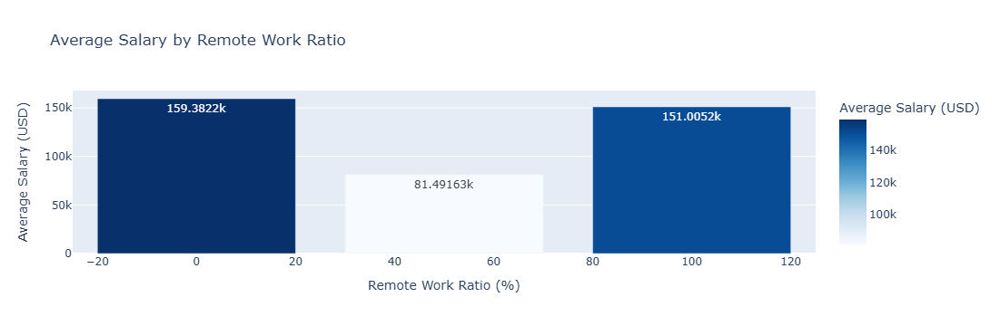

In [30]:
# 6.Is there a correlation between remote work and salary ?


remote_salary = df.groupby('remote_ratio')['salary_in_usd'].mean().reset_index()
print(remote_salary)


# Calculate The Mean :
remote_salary = df.groupby('remote_ratio')['salary_in_usd'].mean().reset_index()

# Polt The Bar :
fig = px.bar(remote_salary,
             x='remote_ratio',
             y='salary_in_usd',
             title='Average Salary by Remote Work Ratio',
             labels={'remote_ratio': 'Remote Work Ratio (%)', 'salary_in_usd': 'Average Salary (USD)'},
             text_auto=True,
             color='salary_in_usd',
             color_continuous_scale='Blues')

fig.show()